In [1]:
#%run input/Format.ipynb
import ROOT as root
from array import array
root.gErrorIgnoreLevel = root.kFatal
%jsroot on
import numpy as np

In [2]:
file_path="/Users/mitrankova/Jupyter/PatternRecognition/input/"
#file_names=["0version_Box_TPC_Au_Au_ZeroField_1mrad_aligned_10evt_9nSkip_75570-0_resid.root"]
file_names=['Au_Au_seeds_37thevt_66522-0_resid.root']
#file_names=['Au_Au_seeds__8evts_7skip_75405-0_resid.root']

In [3]:
# Global mode: use radial triplets everywhere
TRIPLET_MODE = "radial"

def assert_radial():
    global TRIPLET_MODE
    if TRIPLET_MODE != "radial":
        print("Warning: Forcing TRIPLET_MODE='radial'")
        TRIPLET_MODE = "radial"

print("TRIPLET_MODE:", TRIPLET_MODE)


TRIPLET_MODE: radial


In [4]:
hists_read, hists_sim = [], []

# Open ROOT files and keep them open so TTrees remain accessible later
open_files = []  # keep TFile references alive
trees = {
    "cluster": [],
    "residual": [],
    "hit": [],
    "vertex": []
}

for iFile in range(len(file_names)):
    fpath = file_path + file_names[iFile]
    tfile = root.TFile.Open(fpath, "READ")
    if not tfile or tfile.IsZombie():
        print(f"Failed to open {fpath}")
        trees["cluster"].append(None)
        trees["residual"].append(None)
        trees["hit"].append(None)
        trees["vertex"].append(None)
        continue

    open_files.append(tfile)

    # Retrieve trees if available (names from your file structure)
    trees["cluster"].append(tfile.Get("clustertree"))
    trees["residual"].append(tfile.Get("residualtree"))
    trees["hit"].append(tfile.Get("hittree"))
    trees["vertex"].append(tfile.Get("vertextree"))

# Handy shorthand to the first file's trees
cluster_tree = trees["cluster"][0] if trees["cluster"] else None
residual_tree = trees["residual"][0] if trees["residual"] else None
hit_tree = trees["hit"][0] if trees["hit"] else None
vertex_tree = trees["vertex"][0] if trees["vertex"] else None

print(f"Loaded files: {len(open_files)}")
print("hit_tree entries:", hit_tree.GetEntries() if hit_tree else 0)
print("cluster_tree entries:", cluster_tree.GetEntries() if cluster_tree else 0)
print("residual_tree entries:", residual_tree.GetEntries() if residual_tree else 0)

Loaded files: 1
hit_tree entries: 93946
cluster_tree entries: 13109
residual_tree entries: 161


In [5]:
# Quick check: list a few branches from the trees so they are clearly accessible
if hit_tree:
    hit_branches = [hit_tree.GetListOfBranches().At(i).GetName() for i in range(min(100, hit_tree.GetListOfBranches().GetEntries()))]
    print("hit_tree branches (first 10):", hit_branches)
if cluster_tree:
    cluster_branches = [cluster_tree.GetListOfBranches().At(i).GetName() for i in range(min(10, cluster_tree.GetListOfBranches().GetEntries()))]
    print("cluster_tree branches (first 10):", cluster_branches)
if residual_tree:
    residual_branches = [residual_tree.GetListOfBranches().At(i).GetName() for i in range(min(10, residual_tree.GetListOfBranches().GetEntries()))]
    print("residual_tree branches (first 10):", residual_branches)

hit_tree branches (first 10): ['run', 'segment', 'event', 'gl1bco', 'hitsetkey', 'gx', 'gy', 'gz', 'layer', 'sector', 'side', 'stave', 'chip', 'strobe', 'ladderz', 'ladderphi', 'timebucket', 'pad', 'tbin', 'col', 'row', 'segtype', 'tile', 'strip', 'adc', 'zdriftlength', 'mbdcharge']
cluster_tree branches (first 10): ['run', 'segment', 'event', 'gl1bco', 'lx', 'lz', 'gx', 'gy', 'gz', 'phi']
residual_tree branches (first 10): ['run', 'segment', 'event', 'mbdcharge', 'mbdzvtx', 'firedTriggers', 'gl1BunchCrossing', 'trackid', 'tpcid', 'silid']


In [6]:
Npads = [94,128,192]
ADC_treshold_up = [20, 100, 1000000, 100000]
ADC_treshold_down = [0,  20, 60, 200  ]
Select_ADC_treshold = 2  # 0, 1, 2, 3

In [7]:
hists = {}

def get_hist(sector, imod, side):
    key = (sector, imod, side)
    if key in hists:
        return hists[key]

    hist = root.TH3F(
        f"hist3d_hard_sec{sector}_m{imod}_s{side}",
        f"3D ADC sec {sector} mod {imod} side {side}; timebin; pad; layer",
        300, 0,300,
        Npads[imod] , Npads[imod] * sector , Npads[imod] * (sector+1),
        16, 7 + 16*imod, 7 + 16*(imod + 1)
    )
    hists[key] = hist
    return hist

if hit_tree:
    n_entries = int(hit_tree.GetEntries())
    for entry in range(n_entries):
        hit_tree.GetEntry(entry)
        sector = int(hit_tree.sector)
        layer  = int(hit_tree.layer)
        imod   = (layer - 7) // 16
        if imod < 0 or imod > 2:
            continue

        side = int(hit_tree.side)
        #print( "Entry:", entry, "Layer:", layer, "Imod:", imod, "Side:", side , "Sector:", sector)
        if side not in (0, 1):
            continue

        
        #if side==0 and sector==0 and imod ==0 :
        #    print( hit_tree.adc)
        if(hit_tree.adc>ADC_treshold_down[Select_ADC_treshold]):
            get_hist(sector, imod, side).Fill( hit_tree.tbin, hit_tree.pad, layer, hit_tree.adc)
         #   print("Filled!")


In [8]:
hist3d_xyz = root.TH3F("hist3d_xyz", "3D ADC; x; y;z", 240, -60, 60, 240, -60, 60, 150,0, 150)
if hit_tree:
    for entry in range(hit_tree.GetEntries()):
        hit_tree.GetEntry(entry)
        x_hit = hit_tree.gx
        y_hit = hit_tree.gy
        z_hit = hit_tree.gz
        adc_hit = hit_tree.adc
        if (x_hit**2 + y_hit**2)**0.5 > 12:  # only fill if within 100 units
            hist3d_xyz.Fill(x_hit, y_hit, z_hit,adc_hit)


In [9]:
'''c1 = root.TCanvas("c1", "3D hits", 1200, 1000)
hist3d_xyz.Draw("colz")
c1.Draw()'''

'c1 = root.TCanvas("c1", "3D hits", 1200, 1000)\nhist3d_xyz.Draw("colz")\nc1.Draw()'

# Build Tree

In [10]:
import numpy as np
from collections import defaultdict
from scipy.spatial import cKDTree

# collect points per (sector, imod, side)
points = defaultdict(list)   # key -> list of (t, pad, layer)
payload = defaultdict(list)  # key -> list of (adc, entry)

if hit_tree:
    n_entries = int(hit_tree.GetEntries())
    for entry in range(n_entries):
        hit_tree.GetEntry(entry)

        sector = int(hit_tree.sector)
        layer  = int(hit_tree.layer)
        imod   = (layer - 7) // 16
        if imod < 0 or imod > 2:
            continue

        side = int(hit_tree.side)
        if side not in (0, 1):
            continue

        adc = int(hit_tree.adc)
        if  (adc < ADC_treshold_down[Select_ADC_treshold]):
            continue

        tbin = int(hit_tree.tbin)
        pad  = int(hit_tree.pad)

        key = (sector, imod, side)
        points[key].append((tbin, pad, layer))
        payload[key].append((adc, entry))
        used_global = set()
        if sector==0 and imod==0 and side==0:
            if layer==7 and tbin<30:
            #if tbin>10 and tbin<30 and pad>60 and pad<80 and layer>=7 and layer<8:
                print(f"Entry {entry}: tbin={tbin}, pad={pad}, layer={layer}, adc={adc}")
        

# build KD trees
kdtree = {}
pts_arr = {}
for key, pts in points.items():
    arr = np.asarray(pts, dtype=np.float32)
    pts_arr[key] = arr
    kdtree[key] = cKDTree(arr)

print("Built KD-trees:", len(kdtree))


Entry 3862: tbin=26, pad=56, layer=7, adc=112
Entry 3863: tbin=27, pad=56, layer=7, adc=65
Built KD-trees: 72


In [11]:
def box_query(key, tmin, tmax, pmin, pmax, lmin, lmax):
    tree = kdtree[key]
    arr  = pts_arr[key]

    # cheap preselect using a ball around the box center
    center = np.array([(tmin+tmax)/2.0, (pmin+pmax)/2.0, (lmin+lmax)/2.0], dtype=np.float32)
    half   = np.array([(tmax-tmin)/2.0, (pmax-pmin)/2.0, (lmax-lmin)/2.0], dtype=np.float32)
    radius = float(np.linalg.norm(half))  # ball that covers the whole box

    cand = tree.query_ball_point(center, r=radius)

    # exact box filter
    out = []
    for i in cand:
        t, p, l = arr[i]
        if (tmin <= t <= tmax) and (pmin <= p <= pmax) and (lmin <= l <= lmax):
            out.append(i)

    return out  # indices into payload[key]


In [12]:
def knn(key, t, p, l, k=10):
    d, idx = kdtree[key].query([t, p, l], k=k)
    return d, idx


In [13]:
key = (0, 0, 0)
idxs = box_query(key, tmin=10, tmax=30, pmin=50, pmax=60, lmin=7, lmax=7)

print(f"Box query found {len(idxs)} hits in key {key}:")

for i in idxs:
    tbin, pad, layer = pts_arr[key][i]
    adc, entry = payload[key][i]
    print(f"  Entry {entry}: tbin={int(tbin)}, pad={int(pad)}, layer={int(layer)}, adc={adc}")


Box query found 2 hits in key (0, 0, 0):
  Entry 3863: tbin=27, pad=56, layer=7, adc=65
  Entry 3862: tbin=26, pad=56, layer=7, adc=112


In [14]:
import numpy as np
from collections import defaultdict
from scipy.spatial import cKDTree

def build_layer_indices_and_trees(key, pts_arr, payload):
    """
    Input:
      pts_arr[key]  : Nx3 array (tbin, pad, layer)
      payload[key]  : list length N of (adc, entry)
    Output:
      layers[layer] = dict with:
         "idx": global indices of hits in this layer
         "tp" : Mx2 float array of (tbin,pad)
         "adc": M int array
         "tree": cKDTree on tp
    """
    arr = pts_arr[key]
    adcs = np.array([payload[key][i][0] for i in range(len(payload[key]))], dtype=np.int32)
    
    by_layer = defaultdict(list)
    for i in range(arr.shape[0]):
        layer = int(arr[i, 2])
        by_layer[layer].append(i)

    layers = {}
    for layer, idxs in by_layer.items():
        idxs = np.asarray(idxs, dtype=np.int32)
        tp = arr[idxs][:, :2].astype(np.int32)  # (tbin, pad) as integers
        adc = adcs[idxs]
        tree = cKDTree(tp.astype(np.float32)) 
        layers[layer] = {"idx": idxs, "tp": tp, "adc": adc, "tree": tree}

    return layers


# Find local ADC maximums

In [15]:
def is_local_max(layer_data, j):
    """
    8-neighborhood local maximum in (timebin, pad), same layer:
    neighbors are |dt|<=1, |dp|<=1 (excluding itself)
    """
    tp   = layer_data["tp"]
    adc  = layer_data["adc"]
    tree = layer_data["tree"]

    a0 = int(adc[j])


    t0, p0 = tp[j]
    
    # radius that fully contains the 3x3 box
    r = np.sqrt(2.0)
    cand = tree.query_ball_point([t0, p0], r=r)

    for k in cand:
        if k == j:
            continue

        t, p = tp[k]
        if abs(t - t0) <= 1 and abs(p - p0) <= 1:
            if adc[k] >= a0:   # STRICT local max
                return False
    #print(f"Found local max at (t={t0}, p={p0}) with adc={a0}")
    return True



def find_seeds(layers):
    """
    Returns list of seeds as tuples: (layer, j_in_layer)
    """
    seeds = []
    for layer, ld in layers.items():
        M = ld["tp"].shape[0]
        for j in range(M):
            if is_local_max(ld, j):
                seeds.append((layer, j))
    return seeds


In [16]:
def query_box_in_layer(layer_data, t0, p0, dt, dp):
    tp   = layer_data["tp"]   # int32
    tree = layer_data["tree"]

    t0 = int(t0); p0 = int(p0)
    r = float((dt*dt + dp*dp) ** 0.5)
    cand = tree.query_ball_point([float(t0), float(p0)], r=r)

    out = []
    for j in cand:
        t = int(tp[j, 0]); p = int(tp[j, 1])
        if abs(t - t0) <= dt and abs(p - p0) <= dp:
            out.append(j)
    return out

# Chaining

In [17]:

def pick_best_candidate(layer_data, cand_js, t0, p0):
    tp  = layer_data["tp"]   # int32
    adc = layer_data["adc"]

    t0 = int(t0); p0 = int(p0)

    best = None
    best_key = None
    for j in cand_js:
        t = int(tp[j, 0]); p = int(tp[j, 1])
        dist2 = (t - t0)*(t - t0) + (p - p0)*(p - p0)
        key = (int(adc[j]), -dist2)
        if best is None or key > best_key:
            best = j
            best_key = key
    return best


In [18]:
def find_seeds_sorted(layers):
    seeds = []
    for layer, ld in layers.items():
        M = ld["tp"].shape[0]
        for j in range(M):
            if is_local_max(ld, j):
                seeds.append((layer, j, int(ld["adc"][j])))

    # highest ADC first
    seeds.sort(key=lambda x: x[2], reverse=True)
    return seeds


# Find horizontal chains

In [19]:
import numpy as np
from collections import defaultdict, deque
from scipy.spatial import cKDTree

def _order_chain_in_layer(layer_data, chain_seed_js):
    """
    Order a set of seed indices (j in this layer) into a 'nice' polyline order.
    Uses PCA-like 1D projection when possible; falls back to sorting by (t,p).
    """
    tp = layer_data["tp"]  # int32, shape (M,2)
    pts = np.asarray([tp[j] for j in chain_seed_js], dtype=np.float32)  # Nx2

    if len(chain_seed_js) <= 2:
        # stable ordering
        order = np.lexsort((pts[:, 1], pts[:, 0]))  # sort by t then pad
        return [chain_seed_js[i] for i in order]

    # PCA direction = first right-singular vector of centered coords
    c = pts.mean(axis=0, keepdims=True)
    X = pts - c
    # SVD on 2D: X = U S Vt
    _, _, vt = np.linalg.svd(X, full_matrices=False)
    direction = vt[0]  # 2-vector

    s = X @ direction  # projection coordinate
    order = np.argsort(s)
    return [chain_seed_js[i] for i in order]

In [20]:
def chain_avg_dp_dt_between_maxima(chain, layers, seed_set):
    """
    Returns (avg_dp, avg_dt, n_maxima) using absolute dp/dt
    between consecutive maxima in the given chain order.
    """
    maxima = [node for node in chain if node in seed_set]
    if len(maxima) < 2:
        return None, None, len(maxima)

    dp_diffs = []
    dt_diffs = []
    for (ly1, j1), (ly2, j2) in zip(maxima, maxima[1:]):
        t1, p1 = layers[int(ly1)]["tp"][int(j1)]
        t2, p2 = layers[int(ly2)]["tp"][int(j2)]
        dp_diffs.append(abs(int(p2) - int(p1)))
        dt_diffs.append(abs(int(t2) - int(t1)))

    return float(np.mean(dp_diffs)), float(np.mean(dt_diffs)), len(maxima)


In [21]:
from collections import deque

def build_horizontal_cluster_allhits_from_seed(layers, seed_layer, seed_j, used_global,
                                               dt=2, dp=1):
    """
    Flood-fill in ONE layer from a seed, collecting ALL connected hits (same layer),
    using |dt|<=dt, |dp|<=dp.

    Marks hits as used during the fill, but returns the list of global indices it claimed
    so caller can UNDO if the cluster is rejected by quality cuts.
    """
    layer = int(seed_layer)
    ld = layers.get(layer)
    if ld is None:
        return [], []

    seed_j = int(seed_j)
    gi_seed = int(ld["idx"][seed_j])
    if gi_seed in used_global:
        return [], []

    q = deque([seed_j])
    visited_local = set([seed_j])

    chain_js = []
    consumed_gis = []

    while q:
        j = int(q.popleft())
        gi = int(ld["idx"][j])

        # if already used by some earlier accepted chain, don't take it
        if gi in used_global:
            continue

        # claim it
        used_global.add(gi)
        consumed_gis.append(gi)
        chain_js.append(j)

        t0 = int(ld["tp"][j, 0])
        p0 = int(ld["tp"][j, 1])

        neigh = query_box_in_layer(ld, t0, p0, dt=dt, dp=dp)
        for nj in neigh:
            nj = int(nj)
            if nj in visited_local:
                continue
            visited_local.add(nj)
            q.append(nj)

    chain = [(layer, j) for j in chain_js]
    return chain, consumed_gis


In [22]:
def find_horizontal_chains_allhits(layers, seeds_sorted, used_global,
                                   dt=2, dp=1,
                                   min_hits=3,
                                   min_pad_span=5,      # <-- require (pmax - pmin) > 5
                                   order_for_drawing=True):
    """
    seeds_sorted: list of (layer, j, adc) sorted by adc desc
    Builds horizontal clusters; accepts only if:
      - len(cluster) >= min_hits
      - pad span (pmax - pmin) > min_pad_span
    If rejected: UNDO used_global claims for that cluster.
    """
    horizontal_chains = []

    for (layer, j, adc) in seeds_sorted:
        chain, consumed_gis = build_horizontal_cluster_allhits_from_seed(
            layers, layer, j, used_global, dt=dt, dp=dp
        )
        if not chain:
            continue

        ly = int(chain[0][0])
        ld = layers[ly]
        js = [jj for (_, jj) in chain]

        # compute pad span
        pads = [int(ld["tp"][jj, 1]) for jj in js]
        pad_span = (max(pads) - min(pads)) if pads else 0

        # acceptance cuts
        if len(js) < min_hits or pad_span <= min_pad_span:
            # rollback: free hits for vertical iteration / other chains
            for gi in consumed_gis:
                used_global.discard(int(gi))
            continue

        if order_for_drawing:
            js_ord = _order_chain_in_layer(ld, js)
            chain = [(ly, int(jj)) for jj in js_ord]

        horizontal_chains.append(chain)

    return horizontal_chains


# Build Vertical chains

In [23]:
def build_chain_from_seed_unique(layers, seed_layer, seed_j, used_global,
                                 dp_link=2, dt_link=5,
                                 dp_sup=2, dt_sup=5,
                                 layer_step=1,
                                 mark_support_as_used=False):
    chain_main = []
    chain_support = []

    cur_layer, cur_j = int(seed_layer), int(seed_j)

    # If the seed hit is already used, don't "break" (which looks like failure),
    # just return empty so caller can skip cleanly.
    ld0 = layers.get(cur_layer)
    if ld0 is None:
        return chain_main, chain_support
    gi0 = int(ld0["idx"][cur_j])
    if gi0 in used_global:
        return chain_main, chain_support

    while True:
        ld = layers.get(cur_layer)
        if ld is None:
            break

        gi = int(ld["idx"][cur_j])
        if gi in used_global:
            break

        # add main and mark used
        chain_main.append((cur_layer, cur_j))
        used_global.add(gi)

        # integer anchor
        t0 = int(ld["tp"][cur_j, 0])
        p0 = int(ld["tp"][cur_j, 1])

        # support in same layer
        sup_js = query_box_in_layer(ld, t0, p0, dt_sup, dp_sup)
        for sj in sup_js:
            gi_s = int(ld["idx"][sj])
            if gi_s in used_global:
                continue
            chain_support.append((cur_layer, sj))
            if mark_support_as_used:
                used_global.add(gi_s)

        # step to next layer
        next_layer = cur_layer + layer_step
        ld2 = layers.get(next_layer)
        if ld2 is None:
            break

        cand = query_box_in_layer(ld2, t0, p0, dt_link, dp_link)
        if not cand:
            break

        # pick best UNUSED candidate: max ADC then closest (integer dist2)
        best = None
        best_key = None
        for j2 in cand:
            gi2 = int(ld2["idx"][j2])
            if gi2 in used_global:
                continue
            t2 = int(ld2["tp"][j2, 0])
            p2 = int(ld2["tp"][j2, 1])
            dist2 = (t2 - t0)*(t2 - t0) + (p2 - p0)*(p2 - p0)
            key = (int(ld2["adc"][j2]), -dist2)
            if best is None or key > best_key:
                best = j2
                best_key = key

        if best is None:
            break

        cur_layer, cur_j = next_layer, best

    return chain_main, chain_support


In [24]:
def dump_chain(key, chain_main, chain_support, layers, pts_arr, payload, max_lines=200):
    print(f"\n=== CHAIN key={key} main_hits={len(chain_main)} support_hits={len(chain_support)} ===")

    def print_hit(layer, j):
        gi = int(layers[layer]["idx"][j])  # global index
        tbin, pad, layer0 = pts_arr[key][gi]
        adc, entry = payload[key][gi]
        print(f"  L={int(layer0):2d}  t={int(tbin):3d}  pad={int(pad):4d}  adc={int(adc):5d}  entry={entry}")

    print("Main hits:")
    for (layer, j) in chain_main[:max_lines]:
        print_hit(layer, j)

    # If you want to see supports too:
    print("Support hits:")
    for (layer, j) in chain_support[:max_lines]:
        print_hit(layer, j)


In [25]:
key = (0, 0, 0)
layers = build_layer_indices_and_trees(key, pts_arr, payload)

# Better to sort by ADC so strongest maxima "claims" the horizontal cluster first
seeds_sorted = find_seeds_sorted(layers)   # (layer, j, adc)
print("Seeds found:", len(seeds_sorted))

used_global = set()

seed_set = set((int(ly), int(j)) for (ly, j, adc) in seeds_sorted)

# ---- 1st iteration: horizontal chains (same layer) INCLUDING ALL hits ----
horizontal_chains = find_horizontal_chains_allhits(
    layers, seeds_sorted, used_global,
    dt=2, dp=1,
    min_hits=3,
    min_pad_span=5,       # <-- >5 pads
    order_for_drawing=True
)

horizontal_chain_avg_dpdts = []
for chain in horizontal_chains:
    avg_dp, avg_dt, n_max = chain_avg_dp_dt_between_maxima(chain, layers, seed_set)
    horizontal_chain_avg_dpdts.append((avg_dp, avg_dt, n_max))


# ---- remaining seeds for 2nd iteration (vertical chains) ----
seeds_remaining = []
for (ly, j, adc) in seeds_sorted:
    gi = int(layers[int(ly)]["idx"][int(j)])
    if gi not in used_global:
        seeds_remaining.append((int(ly), int(j)))

# ---- 2nd iteration: vertical chains over consecutive layers ----
vertical_chain_avg_dpdts = []
for (seed_layer, seed_j) in seeds_remaining[:10]:
    chain_main, chain_support = build_chain_from_seed_unique(
        layers, seed_layer, seed_j, used_global,
        dp_link=2, dt_link=5,
        dp_sup=2, dt_sup=5,
        layer_step=1
    )
    avg_dp, avg_dt, n_max = chain_avg_dp_dt_between_maxima(chain_main, layers, seed_set)
    vertical_chain_avg_dpdts.append((avg_dp, avg_dt, n_max))
    dump_chain(key, chain_main, chain_support, layers, pts_arr, payload)


Seeds found: 644

=== CHAIN key=(0, 0, 0) main_hits=1 support_hits=12 ===
Main hits:
  L=22  t=196  pad=  11  adc=  955  entry=33024
Support hits:
  L=22  t=192  pad=   9  adc=  317  entry=33000
  L=22  t=193  pad=   9  adc=   87  entry=33001
  L=22  t=192  pad=  10  adc=  103  entry=33013
  L=22  t=191  pad=  10  adc=   97  entry=33012
  L=22  t=196  pad=  10  adc=  275  entry=33016
  L=22  t=195  pad=  10  adc=  208  entry=33015
  L=22  t=195  pad=  11  adc=  678  entry=33023
  L=22  t=195  pad=  12  adc=  274  entry=33030
  L=22  t=196  pad=  12  adc=  432  entry=33031
  L=22  t=197  pad=  10  adc=   73  entry=33017
  L=22  t=197  pad=  11  adc=  248  entry=33025
  L=22  t=197  pad=  12  adc=  104  entry=33032

=== CHAIN key=(0, 0, 0) main_hits=1 support_hits=10 ===
Main hits:
  L=21  t=219  pad=  78  adc=  952  entry=31855
Support hits:
  L=21  t=218  pad=  80  adc=   79  entry=31860
  L=21  t=218  pad=  78  adc=  175  entry=31854
  L=21  t=221  pad=  76  adc=  352  entry=31852
  L

# Fit

In [68]:
import numpy as np
from scipy.optimize import curve_fit
import ROOT as root

# ============================================================
# 1. Define the Mathematical Models
# ============================================================

def model_parabola(x, a, b, c):
    """
    Parabolic model: y = ax^2 + bx + c
    Used for vertical chains (Pad vs Layer).
    """
    return a * x**2 + b * x + c

def model_catenary(x, a, x0, y0):
    """
    Catenary model: y = a * cosh((x - x0) / a) + y0
    Used for horizontal chains (Pad vs TimeBin).
    """
    # Protect against division by zero or extremely small 'a'
    # If 'a' is too small, the curve becomes a sharp V, which causes numerical instability.
    a_safe = np.where(np.abs(a) < 1e-5, 1e-5 * np.sign(a) + 1e-9, a)
    return a_safe * np.cosh((x - x0) / a_safe) + y0

def model_linear(x, d, e):
    """
    Linear model: y = dx + e
    Used for the secondary coordinate projection.
    """
    return d * x + e

# ============================================================
# 2. Main Fitting Function
# ============================================================

def sagitta_fit_3d(chain, key, layers, pts_arr, payload):
    """
    Fits all hits in a chain using a weighted sagitta model.
    
    - Vertical chains: Parabolic fit (Pad vs Layer)
    - Horizontal chains: Catenary fit (Pad vs TimeBin)
    
    Weights are derived from ADC values (sigma = 1/sqrt(ADC)).
    
    Args:
        chain: List of (layer, index) tuples.
        key: (sector, module, side) tuple.
        layers: Layer index structure.
        pts_arr: Dictionary of point coordinates.
        payload: Dictionary of payload data (ADC).
        
    Returns:
        fit_params: Dictionary of fit results.
        fit_line: ROOT.TPolyLine3D object for drawing.
    """
    
    # --- Step A: Extract Data for All Hits in Chain ---
    points = []
    weights = []
    
    for item in chain:
        # Ensure item has at least layer and index
        if len(item) >= 2:
            ly, idx = int(item[0]), int(item[1])
            try:
                # Get global index
                gi = int(layers[ly]["idx"][idx])
                
                # Extract coordinates: [tbin, pad, layer]
                tbin, pad, layer_val = pts_arr[key][gi][:3]
                
                # Extract ADC for weighting
                adc = float(payload[key][gi][0])
                
                points.append([tbin, pad, layer_val])
                weights.append(adc)
            except (KeyError, IndexError):
                continue
    
    # Need at least 3 points to fit a curve with 3 parameters
    if len(points) < 3:
        return None, None

    points = np.array(points)
    weights = np.array(weights)
    
    # Calculate Sigma for curve_fit (sigma ~ 1/sqrt(weight))
    # Ensure weights are positive to avoid division by zero
    weights = np.maximum(weights, 1.0)
    sigma_weights = 1.0 / np.sqrt(weights)

    # Extract coordinate arrays
    tbins = points[:, 0]
    pads  = points[:, 1]
    lys   = points[:, 2]

    # --- Step B: Determine Orientation & Select Model ---
    # If the chain spans less than half a layer, it is Horizontal.
    is_horizontal = (lys.max() - lys.min()) < 0.5

    if is_horizontal:
        # === HORIZONTAL MODE ===
        # Independent Var: TimeBin
        # Main Curve: Pad (Catenary)
        # Secondary Curve: Layer (Linear)
        x = tbins
        y_main = pads
        y_sec = lys
        
        fit_func_main = model_catenary
        fit_name = "horizontal_catenary"
        
        # Initial Guesses for Catenary
        p0_a = 50.0  # Start with a "flat" tension
        p0_x0 = np.mean(x)
        p0_y0 = np.min(y_main) - p0_a
        p0_main = [p0_a, p0_x0, p0_y0]
        
    else:
        # === VERTICAL MODE ===
        # Independent Var: Layer
        # Main Curve: Pad (Parabola)
        # Secondary Curve: TimeBin (Linear)
        x = lys
        y_main = pads
        y_sec = tbins
        
        fit_func_main = model_parabola
        fit_name = "vertical_parabola"
        p0_main = None # curve_fit estimates parabola parameters automatically

    # Sort data by the independent variable (x) for correct plotting and fitting
    sort_idx = np.argsort(x)
    x = x[sort_idx]
    y_main = y_main[sort_idx]
    y_sec = y_sec[sort_idx]
    sigma_weights = sigma_weights[sort_idx]
    weights_sorted = weights[sort_idx]

    # Check for singular input (all x values identical)
    if x[-1] == x[0]:
        return None, None

    # --- Step C: Perform Weighted Fits ---
    try:
        # 1. Fit Main Curve (Pad projection)
        popt_main, pcov_main = curve_fit(
            fit_func_main, x, y_main, 
            p0=p0_main, 
            sigma=sigma_weights, 
            absolute_sigma=False,
            maxfev=10000 # Allow more iterations for catenary
        )
        
        # 2. Fit Secondary Curve (Linear projection)
        popt_sec, pcov_sec = curve_fit(
            model_linear, x, y_sec,
            sigma=sigma_weights,
            absolute_sigma=False
        )
        
    except Exception as e:
        # print(f"Fit failed: {e}")
        return None, None

    # --- Step D: Calculate Statistics & Sagitta ---
    y_main_fit = fit_func_main(x, *popt_main)
    
    # Weighted Chi2
    resid_main = y_main - y_main_fit
    chi2_main = np.sum(weights_sorted * resid_main**2) / np.sum(weights_sorted)
    
    # Sagitta Calculation
    # Sagitta = Max deviation of the curve from the chord connecting endpoints
    x_start, x_end = x[0], x[-1]
    x_mid = (x_start + x_end) / 2.0
    
    y_start = fit_func_main(x_start, *popt_main)
    y_end = fit_func_main(x_end, *popt_main)
    
    # Chord value at midpoint
    y_chord_mid = y_start + (y_end - y_start) * 0.5
    # Curve value at midpoint
    y_curve_mid = fit_func_main(x_mid, *popt_main)
    
    sagitta = abs(y_curve_mid - y_chord_mid)

    # Package Results
    fit_params = {
        'mode': fit_name,
        'pad_params': popt_main,
        'lin_params': popt_sec,
        'sagitta': sagitta,
        'chi2_pad': chi2_main,
        'n_hits': len(points),
        'total_adc': np.sum(weights)
    }

    # --- Step E: Create Visualization Object ---
    # Generate smooth points for drawing
    x_draw = np.linspace(x_start, x_end, 50)
    y_main_draw = fit_func_main(x_draw, *popt_main)
    y_sec_draw = model_linear(x_draw, *popt_sec)
    
    fit_line = root.TPolyLine3D(len(x_draw))
    for i in range(len(x_draw)):
        if is_horizontal:
            # x=tbin, y_main=pad, y_sec=layer
            fit_line.SetPoint(i, float(x_draw[i]), float(y_main_draw[i]), float(y_sec_draw[i]))
        else:
            # x=layer, y_main=pad, y_sec=tbin
            fit_line.SetPoint(i, float(y_sec_draw[i]), float(y_main_draw[i]), float(x_draw[i]))

    return fit_params, fit_line


In [69]:
import numpy as np
from scipy.optimize import least_squares

# ------------------------------------------------------------
# Step 1: Rotate points so that straight-line fit is horizontal
# ------------------------------------------------------------

def rotate_points_to_x_axis(x, y):
    # Fit y = m x + b
    A = np.vstack([x, np.ones_like(x)]).T
    m, b = np.linalg.lstsq(A, y, rcond=None)[0]

    # Rotation angle to make line horizontal
    theta = np.arctan(m)

    R = np.array([[ np.cos(theta), np.sin(theta)],
                  [-np.sin(theta), np.cos(theta)]])

    pts = np.vstack([x, y - b])
    xr, yr = R @ pts

    return xr, yr, theta, b


# ------------------------------------------------------------
# Step 2: Sagitta model (Eq. 3.6)
# ------------------------------------------------------------

def sagitta_model(params, x):
    S, x0, invR = params

    dx = (x - x0)

    y = (S
         - 0.5 * invR       * dx**2
         - 1/8 * invR**3    * dx**4
         - 1/16 * invR**5   * dx**6
    )

    return y


# ------------------------------------------------------------
# Step 3: Fit S, x0, invR using least squares
# ------------------------------------------------------------

def fit_sagitta_circle(x, y):

    xr, yr, theta, b = rotate_points_to_x_axis(x, y)

    # initial guesses
    S0 = np.max(yr)             # sagitta roughly max height
    x0_0 = xr[np.argmax(yr)]    # apex x-position
    invR0 = 1.0 / 100.0         # R ~ 100 cm for typical TPC tracks

    params0 = np.array([S0, x0_0, invR0])

    def residuals(params):
        return sagitta_model(params, xr) - yr

    res = least_squares(residuals, params0)
    S, x0, invR = res.x

    # Reconstruct circle radius
    R = 1.0 / invR

    # Recover circle center in rotated coordinates
    Xc_prime = x0
    Yc_prime = S - R

    # Rotate back to original coordinates
    xc = Xc_prime * np.cos(theta) - Yc_prime * np.sin(theta)
    yc = Xc_prime * np.sin(theta) + Yc_prime * np.cos(theta) + b

    return xc, yc, R, (S, x0, invR), (xr, yr, theta, b)


# ------------------------------------------------------------
# Helper: circle → perigee parameters
# ------------------------------------------------------------
import math

def circle_to_perigee(xc, yc, R, invR):

    D = math.hypot(xc, yc)      # distance center -> origin
    R_abs = abs(R)
    sign_k = math.copysign(1.0, invR) if invR != 0 else 1.0

    # Degenerate fallbacks
    if D < 1e-12 or R_abs < 1e-12:
        # Circle center extremely close to origin or radius tiny:
        # choose a simple fallback on +x axis
        xp, yp = R_abs, 0.0
        dca = abs(R_abs)
    else:
        # Unit vector from origin to center
        ux = xc / D
        uy = yc / D

        # Origin outside or on circle -> move towards origin
        if D >= R_abs:
            xp = xc - ux * R_abs
            yp = yc - uy * R_abs
        # Origin inside circle -> closest point is opposite direction
        else:
            xp = xc + ux * R_abs
            yp = yc + uy * R_abs

        dca = math.hypot(xp, yp)

    # Signed DCA
    d0 = sign_k * dca

    # Tangent direction at perigee: r = P - C
    rx = xp - xc
    ry = yp - yc
    rnorm = math.hypot(rx, ry)
    if rnorm < 1e-12:
        # fallback
        tx, ty = 0.0, 1.0
    else:
        # choose tangent direction from curvature sign
        if sign_k > 0:
            # rotate r by +90 degrees
            tx = -ry / rnorm
            ty =  rx / rnorm
        else:
            # rotate r by -90 degrees
            tx =  ry / rnorm
            ty = -rx / rnorm

    phi0 = math.atan2(ty, tx)
    kappa = invR

    return dca, d0, phi0, kappa, xp, yp



# ------------------------------------------------------------
# Wrapper: fit sagitta and output perigee instead of helix
# ------------------------------------------------------------

def fit_sagitta_perigee(x, y):

    xc, yc, R, (S, x0, invR), aux = fit_sagitta_circle(x, y)
    dca, d0, phi0, kappa, xp, yp = circle_to_perigee(xc, yc, R, invR)
    return dca, d0, phi0, kappa, xp, yp, (xc, yc, R), ((S, x0, invR), aux)


In [70]:
import numpy as np
from scipy.optimize import least_squares

# ------------------------------------------------------------
# Step 1: Rotate points so that straight-line fit is horizontal
# ------------------------------------------------------------

def rotate_points_to_x_axis(x, y):
    # Fit y = m x + b
    A = np.vstack([x, np.ones_like(x)]).T
    m, b = np.linalg.lstsq(A, y, rcond=None)[0]

    # Rotation angle to make line horizontal
    theta = np.arctan(m)

    R = np.array([[ np.cos(theta), np.sin(theta)],
                  [-np.sin(theta), np.cos(theta)]])

    pts = np.vstack([x, y - b])
    xr, yr = R @ pts

    return xr, yr, theta, b


# ------------------------------------------------------------
# Step 2: Sagitta model (Eq. 3.6)
# ------------------------------------------------------------

def sagitta_model(params, x):
    S, x0, invR = params

    dx = (x - x0)

    y = (S
         - 0.5 * invR       * dx**2
         - 1/8 * invR**3    * dx**4
         - 1/16 * invR**5   * dx**6
    )

    return y


# ------------------------------------------------------------
# Step 3: Fit S, x0, invR using least squares
# ------------------------------------------------------------

def fit_sagitta_circle(x, y):

    xr, yr, theta, b = rotate_points_to_x_axis(x, y)

    # initial guesses
    S0 = np.max(yr)             # sagitta roughly max height
    x0_0 = xr[np.argmax(yr)]    # apex x-position
    invR0 = 1.0 / 100.0         # R ~ 100 cm for typical TPC tracks

    params0 = np.array([S0, x0_0, invR0])

    def residuals(params):
        return sagitta_model(params, xr) - yr

    res = least_squares(residuals, params0)
    S, x0, invR = res.x

    # Reconstruct circle radius
    R = 1.0 / invR

    # Recover circle center in rotated coordinates
    Xc_prime = x0
    Yc_prime = S - R

    # Rotate back to original coordinates
    xc = Xc_prime * np.cos(theta) - Yc_prime * np.sin(theta)
    yc = Xc_prime * np.sin(theta) + Yc_prime * np.cos(theta) + b

    return xc, yc, R, (S, x0, invR), (xr, yr, theta, b)


# ------------------------------------------------------------
# Helper: circle → perigee parameters
# ------------------------------------------------------------
import math

def circle_to_perigee(xc, yc, R, invR):

    D = math.hypot(xc, yc)      # distance center -> origin
    R_abs = abs(R)
    sign_k = math.copysign(1.0, invR) if invR != 0 else 1.0

    # Degenerate fallbacks
    if D < 1e-12 or R_abs < 1e-12:
        # Circle center extremely close to origin or radius tiny:
        # choose a simple fallback on +x axis
        xp, yp = R_abs, 0.0
        dca = abs(R_abs)
    else:
        # Unit vector from origin to center
        ux = xc / D
        uy = yc / D

        # Origin outside or on circle -> move towards origin
        if D >= R_abs:
            xp = xc - ux * R_abs
            yp = yc - uy * R_abs
        # Origin inside circle -> closest point is opposite direction
        else:
            xp = xc + ux * R_abs
            yp = yc + uy * R_abs

        dca = math.hypot(xp, yp)

    # Signed DCA
    d0 = sign_k * dca

    # Tangent direction at perigee: r = P - C
    rx = xp - xc
    ry = yp - yc
    rnorm = math.hypot(rx, ry)
    if rnorm < 1e-12:
        # fallback
        tx, ty = 0.0, 1.0
    else:
        # choose tangent direction from curvature sign
        if sign_k > 0:
            # rotate r by +90 degrees
            tx = -ry / rnorm
            ty =  rx / rnorm
        else:
            # rotate r by -90 degrees
            tx =  ry / rnorm
            ty = -rx / rnorm

    phi0 = math.atan2(ty, tx)
    kappa = invR

    return dca, d0, phi0, kappa, xp, yp



# ------------------------------------------------------------
# Wrapper: fit sagitta and output perigee instead of helix
# ------------------------------------------------------------

def fit_sagitta_perigee(x, y):

    xc, yc, R, (S, x0, invR), aux = fit_sagitta_circle(x, y)
    dca, d0, phi0, kappa, xp, yp = circle_to_perigee(xc, yc, R, invR)
    return dca, d0, phi0, kappa, xp, yp, (xc, yc, R), ((S, x0, invR), aux)


In [71]:
def fit_zr_linear(x, y, z, use_center=False, xc=0.0, yc=0.0):

    x = np.asarray(x, float)
    y = np.asarray(y, float)
    z = np.asarray(z, float)

    if use_center:
        r = np.sqrt((x - xc)**2 + (y - yc)**2)
    else:
        r = np.sqrt(x**2 + y**2)

    A = np.vstack([r, np.ones_like(r)]).T
    m, c = np.linalg.lstsq(A, z, rcond=None)[0]

    z_fit = m * r + c
    residuals = z - z_fit
    chi2 = float(np.sum(residuals**2))
    ndof = max(len(z) - 2, 1)

    return m, c, chi2, ndof, r, z_fit


In [72]:
import math

def zr_to_z0_theta(m_zr, c_zr, xp, yp):

    r_p = math.hypot(xp, yp)
    z0 = m_zr * r_p + c_zr

    lambda_trk = math.atan(m_zr)          # our convention: tan(lambda) = m_zr
    theta = 0.5 * math.pi - lambda_trk    # theta = pi/2 - lambda

    return z0, theta, lambda_trk


# Drawing

In [73]:
def draw_chain_3d(chain_main, key, layers, pts_arr, color, width=2):
    """
    chain_main: list of (layer, j_in_layer) in order
    """
    n = len(chain_main)
    if n < 2:
        return None

    pl = root.TPolyLine3D(n)
    pl.SetLineColor(color)
    pl.SetLineWidth(width)

    for i, (layer, j) in enumerate(chain_main):
        gi = layers[layer]["idx"][j]  # global index
        tbin, pad, layer0 = pts_arr[key][gi]
        #print(f"Chain point {i}: layer={layer0}, tbin={tbin}, pad={pad}")
        pl.SetPoint(i, float(tbin), float(pad), float(layer0))

    pl.Draw("same")
    return pl

CHAIN_COLORS = [
    root.kRed + 1,
    root.kAzure + 2,
    root.kGreen + 2,
    root.kMagenta + 1,
    root.kOrange + 7,
    root.kCyan + 2,
    root.kViolet,
    root.kPink + 9,
]


In [74]:
def draw_local_maxima_3d(seeds, key, layers, pts_arr, color, mstyle=20, msize=1.2):
    """
    seeds: list of (layer, j_in_layer)
    Draw as TPolyMarker3D at (tbin, pad, layer)
    """
    n = len(seeds)
    if n == 0:
        return None

    pm = root.TPolyMarker3D(n)
    pm.SetMarkerColor(color)
    pm.SetMarkerStyle(mstyle)
    pm.SetMarkerSize(msize)

    for i, (layer, j) in enumerate(seeds):
        gi = int(layers[layer]["idx"][j])  # global index in pts_arr[key]
        tbin, pad, layer0 = pts_arr[key][gi]
        pm.SetPoint(i, float(tbin), float(pad), float(layer0)+0.5)

    pm.Draw("same")   # important: draw on same canvas
    return pm


# Final Cell

In [75]:
draw_sector = 0
draw_side   = 0

canvases = []
drawn = {}          
drawn_chains = {}   
drawn_fits = {}     # NEW: store fit line references
chain_avg_dpdts = {}
chain_fit_params = {}  # NEW: store fit parameters
drawn_seeds  = {}   

for imod in range(3):
    c = root.TCanvas(
        f"c_sec{draw_sector}_s{draw_side}_mod{imod}",
        f"Sector {draw_sector} Side {draw_side} Module {imod}",
        1500, 1000
    )
    c.cd()

    key = (draw_sector, imod, draw_side)

    if key in hists:
        h3 = hists[key]
        h3.SetTitle(
            f"3D ADC; timebin; pad; layer "
            f"(sec {draw_sector}, side {draw_side}, mod {imod})"
        )
        h3.Draw("SCAT")
        drawn[imod] = h3

        # ---- build per-key structures ----
        layers = build_layer_indices_and_trees(key, pts_arr, payload)

        seeds_sorted = find_seeds_sorted(layers)
        seeds_for_markers = [(ly, j) for (ly, j, adc) in seeds_sorted]

        used_global = set()
        seed_set = set((int(ly), int(j)) for (ly, j, adc) in seeds_sorted)

        # ---- draw local maxima markers ----
        pm = draw_local_maxima_3d(
            seeds_for_markers, key, layers, pts_arr,
            color=root.kRed + 1,
            mstyle=20,
            msize=1.6
        )
        drawn_seeds[imod] = pm

        drawn_chains[imod] = []
        drawn_fits[imod] = []
        chain_fit_params[imod] = {'horizontal': [], 'vertical': []}

        # ============================================================
        # 1st iteration: HORIZONTAL (same-layer) CHAINS
        # ============================================================
        horizontal_chains = find_horizontal_chains_allhits(
            layers, seeds_sorted, used_global,
            dt=2, dp=3,
            min_hits=3,
            min_pad_span=5,
            order_for_drawing=True
        )

        horizontal_chain_avg_dpdts = []
        
        # Draw horizontal chains and fits
        for ic, chain in enumerate(horizontal_chains):
            avg_dp, avg_dt, n_max = chain_avg_dp_dt_between_maxima(chain, layers, seed_set)
            horizontal_chain_avg_dpdts.append((avg_dp, avg_dt, n_max))
            
            color = CHAIN_COLORS[ic % len(CHAIN_COLORS)]
            
            # Draw original chain (thin line)
            #pl = draw_chain_3d(chain, key, layers, pts_arr, color=color, width=2)
            #if pl:
            #    drawn_chains[imod].append(pl)
            
            # Perform sagitta fit and draw
            fit_params, fit_line = sagitta_fit_3d(chain, key, layers, pts_arr, payload)
            if fit_line:
                fit_line.SetLineColor(color)
                fit_line.SetLineWidth(6)
                fit_line.SetLineStyle(1)  # dashed line for fit
                fit_line.Draw("same")
                drawn_fits[imod].append(fit_line)
                chain_fit_params[imod]['horizontal'].append(fit_params)
             
                
                # Print fit quality for first few chains
                if ic < 3:
                    print(f"\nHorizontal Chain {ic} (module {imod}):")
                    #print_fit_quality(fit_params, f"  ")

        # ============================================================
        # 2nd iteration: VERTICAL chains
        # ============================================================
        vertical_chain_avg_dpdts = []
        
        seeds_remaining = []
        for (ly, j, adc) in seeds_sorted:
            gi = int(layers[int(ly)]["idx"][int(j)])
            if gi not in used_global:
                seeds_remaining.append((int(ly), int(j)))

        for ic, (seed_layer, seed_j) in enumerate(seeds_remaining):
            chain_main, _ = build_chain_from_seed_unique(
                layers,
                seed_layer,
                seed_j,
                used_global,
                dp_link=3,
                dt_link=6,
                dp_sup=2,
                dt_sup=5,
                layer_step=1
            )

            avg_dp, avg_dt, n_max = chain_avg_dp_dt_between_maxima(chain_main, layers, seed_set)
            vertical_chain_avg_dpdts.append((avg_dp, avg_dt, n_max))

            if len(chain_main) < 5:
                continue

            color = CHAIN_COLORS[ic % len(CHAIN_COLORS)]
            
            # Draw original chain (thicker line)
            #pl = draw_chain_3d(chain_main, key, layers, pts_arr, color=color, width=4)
            #if pl:
            #    drawn_chains[imod].append(pl)
            
            # Perform sagitta fit and draw
            fit_params, fit_line = sagitta_fit_3d(chain_main, key, layers, pts_arr, payload)
            if fit_line:
                fit_line.SetLineColor(color)
                fit_line.SetLineWidth(6)
                fit_line.SetLineStyle(1)  # dashed line for fit
                fit_line.Draw("same")
                drawn_fits[imod].append(fit_line)
                chain_fit_params[imod]['vertical'].append(fit_params)
                
                # Print fit quality for first few chains
                if ic < 3:
                    print(f"\nVertical Chain {ic} (module {imod}):")
                    #print_fit_quality(fit_params, f"  ")

        chain_avg_dpdts[imod] = {
            "horizontal": horizontal_chain_avg_dpdts,
            "vertical": vertical_chain_avg_dpdts,
        }

    c.Update()
    canvases.append(c)

for c in canvases:
    c.Draw()

# Print summary statistics
print("\n" + "="*60)
print("FIT QUALITY SUMMARY")
print("="*60)
for imod in range(3):
    if imod in chain_fit_params:
        h_fits = chain_fit_params[imod]['horizontal']
        v_fits = chain_fit_params[imod]['vertical']
        
        print(f"\nModule {imod}:")
        print(f"  Horizontal chains: {len(h_fits)}")
        if h_fits:
            avg_sag = np.mean([f['sagitta'] for f in h_fits if f])
            avg_chi2 = np.mean([f['chi2_pad'] for f in h_fits if f])
            print(f"    Avg sagitta: {avg_sag:.4f}")
            print(f"    Avg chi2 (pad): {avg_chi2:.4f}")
        
        print(f"  Vertical chains: {len(v_fits)}")
        if v_fits:
            avg_sag = np.mean([f['sagitta'] for f in v_fits if f])
            avg_chi2 = np.mean([f['chi2_pad'] for f in v_fits if f])
            print(f"    Avg sagitta: {avg_sag:.4f}")
            print(f"    Avg chi2 (pad): {avg_chi2:.4f}")


Horizontal Chain 0 (module 0):

Horizontal Chain 1 (module 0):

Horizontal Chain 2 (module 0):


/var/folders/wf/dqlw1kgx1cxg7q7v57dglr0w0000gp/T/ipykernel_15426/3272999351.py:157: OptimizeWarning: Covariance of the parameters could not be estimated
  popt_sec, pcov_sec = curve_fit(



Horizontal Chain 0 (module 1):

Horizontal Chain 1 (module 1):

Horizontal Chain 2 (module 1):

Horizontal Chain 0 (module 2):

Horizontal Chain 1 (module 2):

Horizontal Chain 2 (module 2):

Vertical Chain 2 (module 2):

FIT QUALITY SUMMARY

Module 0:
  Horizontal chains: 43
    Avg sagitta: 0.3369
    Avg chi2 (pad): 13.9563
  Vertical chains: 37
    Avg sagitta: 1.3133
    Avg chi2 (pad): 0.1959

Module 1:
  Horizontal chains: 30
    Avg sagitta: 0.0678
    Avg chi2 (pad): 2.3760
  Vertical chains: 20
    Avg sagitta: 0.6781
    Avg chi2 (pad): 0.1663

Module 2:
  Horizontal chains: 78
    Avg sagitta: 0.1375
    Avg chi2 (pad): 6.1180
  Vertical chains: 6
    Avg sagitta: 0.4960
    Avg chi2 (pad): 0.1814


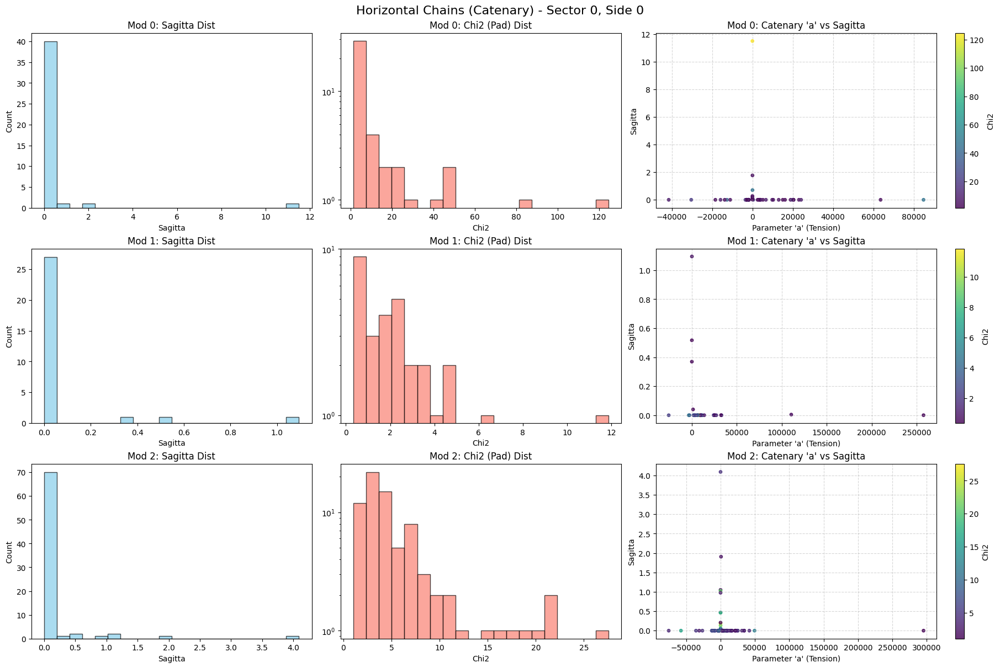

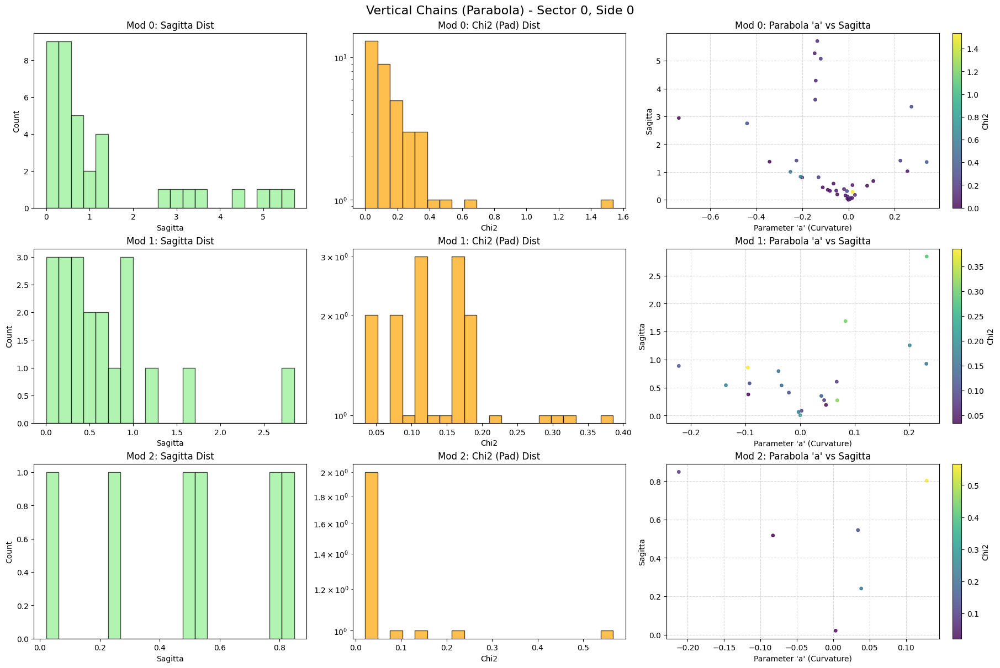

In [76]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure we have data to plot
if 'chain_fit_params' not in locals() or not chain_fit_params:
    print("No fit parameters found. Please run the fitting loop first.")
else:
    modules = sorted(chain_fit_params.keys())
    n_mods = len(modules)
    
    # ============================================================
    # 1. HORIZONTAL CHAINS (Catenary Fits)
    # ============================================================
    fig_h, axes_h = plt.subplots(n_mods, 3, figsize=(18, 4 * n_mods), constrained_layout=True)
    fig_h.suptitle(f"Horizontal Chains (Catenary) - Sector {draw_sector}, Side {draw_side}", fontsize=16)

    # Handle case of single module (axes is 1D array) vs multiple (2D array)
    if n_mods == 1: axes_h = np.array([axes_h])

    for i, imod in enumerate(modules):
        fits = chain_fit_params[imod].get('horizontal', [])
        ax_row = axes_h[i]
        
        if not fits:
            for ax in ax_row:
                ax.text(0.5, 0.5, "No Horizontal Fits", ha='center', va='center')
            continue

        # Extract parameters
        sagittas = np.array([f['sagitta'] for f in fits])
        chi2s = np.array([f['chi2_pad'] for f in fits])
        # pad_params for catenary is [a, x0, y0]. We want 'a' (tension).
        params_a = np.array([f['pad_params'][0] for f in fits])

        # Plot 1: Sagitta Distribution
        ax_row[0].hist(sagittas, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
        ax_row[0].set_title(f"Mod {imod}: Sagitta Dist")
        ax_row[0].set_xlabel("Sagitta")
        ax_row[0].set_ylabel("Count")

        # Plot 2: Chi2 Distribution (Log scale often helps)
        ax_row[1].hist(chi2s, bins=20, color='salmon', edgecolor='black', alpha=0.7)
        ax_row[1].set_title(f"Mod {imod}: Chi2 (Pad) Dist")
        ax_row[1].set_xlabel("Chi2")
        ax_row[1].set_yscale('log')

        # Plot 3: Parameter Space (Tension 'a' vs Sagitta)
        # Expectation: Higher 'a' (flatter) -> Lower Sagitta
        sc = ax_row[2].scatter(params_a, sagittas, c=chi2s, cmap='viridis', s=15, alpha=0.8)
        ax_row[2].set_title(f"Mod {imod}: Catenary 'a' vs Sagitta")
        ax_row[2].set_xlabel("Parameter 'a' (Tension)")
        ax_row[2].set_ylabel("Sagitta")
        plt.colorbar(sc, ax=ax_row[2], label='Chi2')
        ax_row[2].grid(True, linestyle='--', alpha=0.5)

    plt.show()

    # ============================================================
    # 2. VERTICAL CHAINS (Parabolic Fits)
    # ============================================================
    fig_v, axes_v = plt.subplots(n_mods, 3, figsize=(18, 4 * n_mods), constrained_layout=True)
    fig_v.suptitle(f"Vertical Chains (Parabola) - Sector {draw_sector}, Side {draw_side}", fontsize=16)

    if n_mods == 1: axes_v = np.array([axes_v])

    for i, imod in enumerate(modules):
        fits = chain_fit_params[imod].get('vertical', [])
        ax_row = axes_v[i]
        
        if not fits:
            for ax in ax_row:
                ax.text(0.5, 0.5, "No Vertical Fits", ha='center', va='center')
            continue

        # Extract parameters
        sagittas = np.array([f['sagitta'] for f in fits])
        chi2s = np.array([f['chi2_pad'] for f in fits])
        # pad_params for parabola is [a, b, c]. We want 'a' (curvature).
        params_a = np.array([f['pad_params'][0] for f in fits])

        # Plot 1: Sagitta Distribution
        ax_row[0].hist(sagittas, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
        ax_row[0].set_title(f"Mod {imod}: Sagitta Dist")
        ax_row[0].set_xlabel("Sagitta")
        ax_row[0].set_ylabel("Count")

        # Plot 2: Chi2 Distribution
        ax_row[1].hist(chi2s, bins=20, color='orange', edgecolor='black', alpha=0.7)
        ax_row[1].set_title(f"Mod {imod}: Chi2 (Pad) Dist")
        ax_row[1].set_xlabel("Chi2")
        ax_row[1].set_yscale('log')

        # Plot 3: Parameter Space (Curvature 'a' vs Sagitta)
        # Expectation: Linear correlation (Sagitta ~ proportional to a)
        sc = ax_row[2].scatter(params_a, sagittas, c=chi2s, cmap='viridis', s=15, alpha=0.8)
        ax_row[2].set_title(f"Mod {imod}: Parabola 'a' vs Sagitta")
        ax_row[2].set_xlabel("Parameter 'a' (Curvature)")
        ax_row[2].set_ylabel("Sagitta")
        plt.colorbar(sc, ax=ax_row[2], label='Chi2')
        ax_row[2].grid(True, linestyle='--', alpha=0.5)

    plt.show()


In [77]:
# Create histograms to visualize fit quality
c_quality = root.TCanvas("c_fit_quality", "Fit Quality Distributions", 1600, 800)
c_quality.Divide(3, 2)

# Collect all fit parameters
all_sagitta_h = []
all_sagitta_v = []
all_chi2_pad_h = []
all_chi2_pad_v = []
all_chi2_tbin_h = []
all_chi2_tbin_v = []

for imod in range(3):
    if imod in chain_fit_params:
        for fit in chain_fit_params[imod]['horizontal']:
            if fit:
                all_sagitta_h.append(fit['sagitta'])
                all_chi2_pad_h.append(fit['chi2_pad'])
                all_chi2_tbin_h.append(fit['chi2_tbin'])
        
        for fit in chain_fit_params[imod]['vertical']:
            if fit:
                all_sagitta_v.append(fit['sagitta'])
                all_chi2_pad_v.append(fit['chi2_pad'])
                all_chi2_tbin_v.append(fit['chi2_tbin'])

# Sagitta distribution
c_quality.cd(1)
h_sag_h = root.TH1F("h_sagitta_horiz", "Sagitta (Horizontal);Sagitta;Counts", 50, 0, 5)
h_sag_v = root.TH1F("h_sagitta_vert", "Sagitta (Vertical);Sagitta;Counts", 50, 0, 5)
for s in all_sagitta_h:
    h_sag_h.Fill(s)
for s in all_sagitta_v:
    h_sag_v.Fill(s)
h_sag_h.SetLineColor(root.kBlue)
h_sag_v.SetLineColor(root.kRed)
h_sag_h.Draw()
h_sag_v.Draw("same")

legend1 = root.TLegend(0.6, 0.7, 0.9, 0.9)
legend1.AddEntry(h_sag_h, "Horizontal", "l")
legend1.AddEntry(h_sag_v, "Vertical", "l")
legend1.Draw()

# Chi2 pad distribution
c_quality.cd(2)
h_chi2_pad_h = root.TH1F("h_chi2_pad_horiz", "Chi2 Pad (Horizontal);Chi2;Counts", 50, 0, 10)
h_chi2_pad_v = root.TH1F("h_chi2_pad_vert", "Chi2 Pad (Vertical);Chi2;Counts", 50, 0, 10)
for c2 in all_chi2_pad_h:
    h_chi2_pad_h.Fill(c2)
for c2 in all_chi2_pad_v:
    h_chi2_pad_v.Fill(c2)
h_chi2_pad_h.SetLineColor(root.kBlue)
h_chi2_pad_v.SetLineColor(root.kRed)
h_chi2_pad_h.Draw()
h_chi2_pad_v.Draw("same")

legend2 = root.TLegend(0.6, 0.7, 0.9, 0.9)
legend2.AddEntry(h_chi2_pad_h, "Horizontal", "l")
legend2.AddEntry(h_chi2_pad_v, "Vertical", "l")
legend2.Draw()

# Chi2 tbin distribution
c_quality.cd(3)
h_chi2_tbin_h = root.TH1F("h_chi2_tbin_horiz", "Chi2 Tbin (Horizontal);Chi2;Counts", 50, 0, 10)
h_chi2_tbin_v = root.TH1F("h_chi2_tbin_vert", "Chi2 Tbin (Vertical);Chi2;Counts", 50, 0, 10)
for c2 in all_chi2_tbin_h:
    h_chi2_tbin_h.Fill(c2)
for c2 in all_chi2_tbin_v:
    h_chi2_tbin_v.Fill(c2)
h_chi2_tbin_h.SetLineColor(root.kBlue)
h_chi2_tbin_v.SetLineColor(root.kRed)
h_chi2_tbin_h.Draw()
h_chi2_tbin_v.Draw("same")

legend3 = root.TLegend(0.6, 0.7, 0.9, 0.9)
legend3.AddEntry(h_chi2_tbin_h, "Horizontal", "l")
legend3.AddEntry(h_chi2_tbin_v, "Vertical", "l")
legend3.Draw()

# Sagitta vs Chi2 scatter plots
c_quality.cd(4)
g_sag_chi2_h = root.TGraph(len(all_sagitta_h))
g_sag_chi2_h.SetTitle("Sagitta vs Chi2 Pad (Horizontal);Sagitta;Chi2 Pad")
for i, (s, c) in enumerate(zip(all_sagitta_h, all_chi2_pad_h)):
    g_sag_chi2_h.SetPoint(i, s, c)
g_sag_chi2_h.SetMarkerStyle(20)
g_sag_chi2_h.SetMarkerColor(root.kBlue)
g_sag_chi2_h.SetMarkerSize(0.8)
g_sag_chi2_h.Draw("AP")

c_quality.cd(5)
g_sag_chi2_v = root.TGraph(len(all_sagitta_v))
g_sag_chi2_v.SetTitle("Sagitta vs Chi2 Pad (Vertical);Sagitta;Chi2 Pad")
for i, (s, c) in enumerate(zip(all_sagitta_v, all_chi2_pad_v)):
    g_sag_chi2_v.SetPoint(i, s, c)
g_sag_chi2_v.SetMarkerStyle(20)
g_sag_chi2_v.SetMarkerColor(root.kRed)
g_sag_chi2_v.SetMarkerSize(0.8)
g_sag_chi2_v.Draw("AP")

# N hits vs Sagitta
c_quality.cd(6)
n_hits_h = [fit['n_hits'] for fit in chain_fit_params[0]['horizontal'] + 
            chain_fit_params[1]['horizontal'] + chain_fit_params[2]['horizontal'] if fit]
sag_for_hits_h = [fit['sagitta'] for fit in chain_fit_params[0]['horizontal'] + 
                  chain_fit_params[1]['horizontal'] + chain_fit_params[2]['horizontal'] if fit]

g_hits_sag = root.TGraph(len(n_hits_h))
g_hits_sag.SetTitle("N Hits vs Sagitta (All);N Hits;Sagitta")
for i, (n, s) in enumerate(zip(n_hits_h, sag_for_hits_h)):
    g_hits_sag.SetPoint(i, n, s)
g_hits_sag.SetMarkerStyle(20)
g_hits_sag.SetMarkerColor(root.kBlack)
g_hits_sag.SetMarkerSize(0.8)
g_hits_sag.Draw("AP")

c_quality.Update()
c_quality.Draw()

print("\n" + "="*60)
print(f"Total horizontal chains fitted: {len(all_sagitta_h)}")
print(f"Total vertical chains fitted: {len(all_sagitta_v)}")
print("="*60)

KeyError: 'chi2_tbin'

In [31]:
# Create 1D histograms of chi2/ndf for fit quality
c_chi2ndf = root.TCanvas("c_chi2ndf", "Chi2/NDF Distributions", 1400, 600)
c_chi2ndf.Divide(2, 1)

# Collect all chi2/ndf values
chi2_ndf_pad_h = []
chi2_ndf_pad_v = []
chi2_ndf_tbin_h = []
chi2_ndf_tbin_v = []

for imod in range(3):
    if imod in chain_fit_params:
        for fit in chain_fit_params[imod]['horizontal']:
            if fit and fit['ndf_pad'] > 0:
                chi2_ndf_pad_h.append(fit['chi2_ndf_pad'])
                chi2_ndf_tbin_h.append(fit['chi2_ndf_tbin'])
        
        for fit in chain_fit_params[imod]['vertical']:
            if fit and fit['ndf_pad'] > 0:
                chi2_ndf_pad_v.append(fit['chi2_ndf_pad'])
                chi2_ndf_tbin_v.append(fit['chi2_ndf_tbin'])

# Plot 1: Chi2/NDF for pad fits
c_chi2ndf.cd(1)
h_chi2ndf_pad_h = root.TH1F("h_chi2ndf_pad_horiz", 
                             "Chi2/NDF Pad Fit;Chi2/NDF;Counts", 
                             100, 0, 5)
h_chi2ndf_pad_v = root.TH1F("h_chi2ndf_pad_vert", 
                             "Chi2/NDF Pad Fit;Chi2/NDF;Counts", 
                             100, 0, 5)

for val in chi2_ndf_pad_h:
    h_chi2ndf_pad_h.Fill(val)
for val in chi2_ndf_pad_v:
    h_chi2ndf_pad_v.Fill(val)

h_chi2ndf_pad_h.SetLineColor(root.kBlue)
h_chi2ndf_pad_h.SetLineWidth(2)
h_chi2ndf_pad_v.SetLineColor(root.kRed)
h_chi2ndf_pad_v.SetLineWidth(2)

# Draw both and set log scale
h_chi2ndf_pad_h.Draw()
h_chi2ndf_pad_v.Draw("same")
root.gPad.SetLogy()

# Add legend with statistics
legend_pad = root.TLegend(0.65, 0.7, 0.89, 0.89)
legend_pad.AddEntry(h_chi2ndf_pad_h, 
                    f"Horizontal (N={len(chi2_ndf_pad_h)})", "l")
legend_pad.AddEntry(h_chi2ndf_pad_v, 
                    f"Vertical (N={len(chi2_ndf_pad_v)})", "l")

if chi2_ndf_pad_h:
    mean_h = np.mean(chi2_ndf_pad_h)
    #legend_pad.AddEntry(None, f"Mean H: {mean_h:.3f}", "")
if chi2_ndf_pad_v:
    mean_v = np.mean(chi2_ndf_pad_v)
    #legend_pad.AddEntry(None, f"Mean V: {mean_v:.3f}", "")

legend_pad.Draw()

# Add line at chi2/ndf = 1
line_pad = root.TLine(1, h_chi2ndf_pad_h.GetMinimum(), 
                      1, h_chi2ndf_pad_h.GetMaximum())
line_pad.SetLineColor(root.kBlack)
line_pad.SetLineStyle(2)
line_pad.SetLineWidth(2)
line_pad.Draw()

# Plot 2: Chi2/NDF for tbin fits
c_chi2ndf.cd(2)
h_chi2ndf_tbin_h = root.TH1F("h_chi2ndf_tbin_horiz", 
                              "Chi2/NDF Tbin Fit;Chi2/NDF;Counts", 
                              100, 0, 5)
h_chi2ndf_tbin_v = root.TH1F("h_chi2ndf_tbin_vert", 
                              "Chi2/NDF Tbin Fit;Chi2/NDF;Counts", 
                              100, 0, 5)

for val in chi2_ndf_tbin_h:
    h_chi2ndf_tbin_h.Fill(val)
for val in chi2_ndf_tbin_v:
    h_chi2ndf_tbin_v.Fill(val)

h_chi2ndf_tbin_h.SetLineColor(root.kBlue)
h_chi2ndf_tbin_h.SetLineWidth(2)
h_chi2ndf_tbin_v.SetLineColor(root.kRed)
h_chi2ndf_tbin_v.SetLineWidth(2)

# Draw both and set log scale
h_chi2ndf_tbin_h.Draw()
h_chi2ndf_tbin_v.Draw("same")
root.gPad.SetLogy()

# Add legend with statistics
legend_tbin = root.TLegend(0.65, 0.7, 0.89, 0.89)
legend_tbin.AddEntry(h_chi2ndf_tbin_h, 
                     f"Horizontal (N={len(chi2_ndf_tbin_h)})", "l")
legend_tbin.AddEntry(h_chi2ndf_tbin_v, 
                     f"Vertical (N={len(chi2_ndf_tbin_v)})", "l")

if chi2_ndf_tbin_h:
    mean_h = np.mean(chi2_ndf_tbin_h)
    #legend_tbin.AddEntry(None, f"Mean H: {mean_h:.3f}", "")
if chi2_ndf_tbin_v:
    mean_v = np.mean(chi2_ndf_tbin_v)
    #legend_tbin.AddEntry(None, f"Mean V: {mean_v:.3f}", "")

legend_tbin.Draw()

# Add line at chi2/ndf = 1
line_tbin = root.TLine(1, h_chi2ndf_tbin_h.GetMinimum(), 
                       1, h_chi2ndf_tbin_h.GetMaximum())
line_tbin.SetLineColor(root.kBlack)
line_tbin.SetLineStyle(2)
line_tbin.SetLineWidth(2)
line_tbin.Draw()

c_chi2ndf.Update()
c_chi2ndf.Draw()

# Print summary statistics
print("\n" + "="*70)
print("CHI2/NDF SUMMARY")
print("="*70)
print(f"\nPad Fits (Parabola):")
print(f"  Horizontal chains: N={len(chi2_ndf_pad_h)}")
if chi2_ndf_pad_h:
    print(f"    Mean:   {np.mean(chi2_ndf_pad_h):.4f}")
    print(f"    Median: {np.median(chi2_ndf_pad_h):.4f}")
    print(f"    Std:    {np.std(chi2_ndf_pad_h):.4f}")
    print(f"    Min:    {np.min(chi2_ndf_pad_h):.4f}")
    print(f"    Max:    {np.max(chi2_ndf_pad_h):.4f}")

print(f"\n  Vertical chains: N={len(chi2_ndf_pad_v)}")
if chi2_ndf_pad_v:
    print(f"    Mean:   {np.mean(chi2_ndf_pad_v):.4f}")
    print(f"    Median: {np.median(chi2_ndf_pad_v):.4f}")
    print(f"    Std:    {np.std(chi2_ndf_pad_v):.4f}")
    print(f"    Min:    {np.min(chi2_ndf_pad_v):.4f}")
    print(f"    Max:    {np.max(chi2_ndf_pad_v):.4f}")

print(f"\nTbin Fits (Linear):")
print(f"  Horizontal chains: N={len(chi2_ndf_tbin_h)}")
if chi2_ndf_tbin_h:
    print(f"    Mean:   {np.mean(chi2_ndf_tbin_h):.4f}")
    print(f"    Median: {np.median(chi2_ndf_tbin_h):.4f}")
    print(f"    Std:    {np.std(chi2_ndf_tbin_h):.4f}")

print(f"\n  Vertical chains: N={len(chi2_ndf_tbin_v)}")
if chi2_ndf_tbin_v:
    print(f"    Mean:   {np.mean(chi2_ndf_tbin_v):.4f}")
    print(f"    Median: {np.median(chi2_ndf_tbin_v):.4f}")
    print(f"    Std:    {np.std(chi2_ndf_tbin_v):.4f}")

print("="*70)

# Count good fits (chi2/ndf < 2)
good_pad_h = sum(1 for x in chi2_ndf_pad_h if x < 2)
good_pad_v = sum(1 for x in chi2_ndf_pad_v if x < 2)
good_tbin_h = sum(1 for x in chi2_ndf_tbin_h if x < 2)
good_tbin_v = sum(1 for x in chi2_ndf_tbin_v if x < 2)

print(f"\nFits with Chi2/NDF < 2:")
print(f"  Pad - Horizontal: {good_pad_h}/{len(chi2_ndf_pad_h)} ({100*good_pad_h/len(chi2_ndf_pad_h):.1f}%)")
print(f"  Pad - Vertical:   {good_pad_v}/{len(chi2_ndf_pad_v)} ({100*good_pad_v/len(chi2_ndf_pad_v):.1f}%)")
print(f"  Tbin - Horizontal: {good_tbin_h}/{len(chi2_ndf_tbin_h)} ({100*good_tbin_h/len(chi2_ndf_tbin_h):.1f}%)")
print(f"  Tbin - Vertical:   {good_tbin_v}/{len(chi2_ndf_tbin_v)} ({100*good_tbin_v/len(chi2_ndf_tbin_v):.1f}%)")


CHI2/NDF SUMMARY

Pad Fits (Parabola):
  Horizontal chains: N=52
    Mean:   0.2732
    Median: 0.2661
    Std:    0.1099
    Min:    0.0355
    Max:    0.5820

  Vertical chains: N=102
    Mean:   0.0970
    Median: 0.0451
    Std:    0.1309
    Min:    0.0000
    Max:    0.7298

Tbin Fits (Linear):
  Horizontal chains: N=52
    Mean:   0.0838
    Median: 0.0306
    Std:    0.1210

  Vertical chains: N=102
    Mean:   0.3369
    Median: 0.1291
    Std:    0.4054

Fits with Chi2/NDF < 2:
  Pad - Horizontal: 52/52 (100.0%)
  Pad - Vertical:   102/102 (100.0%)
  Tbin - Horizontal: 52/52 (100.0%)
  Tbin - Vertical:   101/102 (99.0%)
